# Laboratory exercise 2
> Håvard Godal, 245609

Note:

* pxw = $p(\mathbf{x}|\omega_i)$
* Pwpxw = $P(\omega_i)p(\mathbf{x}|\omega_i)$
* Pwx = $P(\omega_i | \mathbf{x})$

**Problem 1**

In [1]:
import numpy as np
from pdffuns import norm2D, normplot

Using some of the variables used in `labsol1.ipynb`

Placing variables that are only defined once outside the class.

In [2]:
x1 = np.arange(-10, 10.5, 0.1).reshape(-1, 1)
x2 = np.arange(-9, 10.5, 0.1).reshape(-1, 1)

X1, X2 = np.meshgrid(x1, x2)

In [3]:
my1 = np.array([3, 6])
my2 = np.array([3, -2]) 

Sgm1 = np.array([[1/2, 0], [0, 2]])
Sgm2 = np.array([[2, 0], [0, 2]])

Pw1 = np.array([0.5, 0.5])
Pw2 = np.array([0.1, 0.9])

my = [my1, my2]
Sgm = [Sgm1, Sgm2]
Pw = [Pw1, Pw2]

M = len(my)

plotoptions = ['Pwpxw', 'Pwx', 'pxw']

For each call of the function, the desired probability density functions are generated and plotted through `normplot`. The function parameter `Pwidxs` takes an array (preferably `[0]`, `[1]`, or `[0, 1]`) which determines what priors the function should use to create the plot(s). 

In [4]:
def labsol2(discr='pxw', Pwidxs=[0], title=''):
    every_g = []

    for Pwidx in Pwidxs:
        pxw = []
        px = 0
        for i in range(M):
            print(my[i])
            print(Sgm[i])
            assert False
            pxw.append(norm2D(my[i], Sgm[i], X1, X2))
            px = px + Pw[Pwidx][i] * pxw[i]

        g = []
        for i in range(M):
            if discr == plotoptions[0]:
                g.append(Pw[Pwidx][i] * pxw[i]) # scaled class-conditional
                overlapping = True
            if discr == plotoptions[1]:
                g.append((pxw[i] * Pw[Pwidx][i]) / px) # posterior
                overlapping = False
            if discr == plotoptions[2]:
                g.append(pxw[i]) # class-conditional
                overlapping = True
        every_g.append(g)

    if discr in plotoptions:
        normplot(every_g, X1, X2, overlapping, title)

Creating the class-conditional PDFs for the classes $\omega_1$ and $\omega_2$.

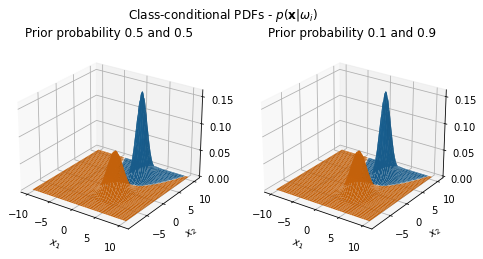

In [5]:
labsol2('pxw', [0, 1],
    ('Class-conditional PDFs - ' +
    r'$p(\mathbf{x}|\omega_i)$'))

Creating the scaled class-conditional PDFs for the classes $\omega_1$ and $\omega_2$.

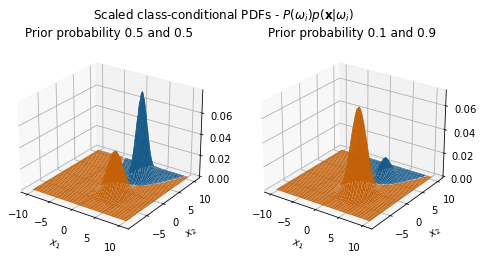

In [6]:
labsol2('Pwpxw', [0, 1],
    ('Scaled class-conditional PDFs - ' +
    r'$P(\omega_i)p(\mathbf{x}|\omega_i)$'))


Creating the posterior distributions for the classes $\omega_1$ and $\omega_2$.

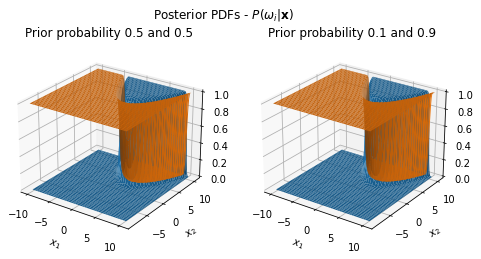

In [7]:
labsol2('Pwx', [0, 1],
    ('Posterior PDFs - ' +
    r'$P(\omega_i | \mathbf{x})$'))

**d)**

The decision boundary and decision areas will be equal for the class-specific PDF and the scaled class-specific PDF with priors $\frac{1}{2}$ and $\frac{1}{2}$. This is because the densities are scaled by the same amount, and does not change in regards to each other.

The decision boundary is marked by a tiny white line separating the two colors, and the decision areas are indicated by the different colors. $Red = \omega_1$ and $blue = \omega_2$.

**e)**

When changing the priors of $\omega_1$ and $\omega_2$ to $\frac{1}{10}$ and $\frac{9}{10}$, respectively, there is a significant change in the scaled class-specific PDFs compared to the class-specific PDFs. The decision boundary moves slightly, and the decision areas changes slightly.

**f)**

Using Bayes rule to compute the posterior PDFs of $\omega_1$ and $\omega_2$ with both priors. Again, the decision boundary and decision areas are close to equal to each other, but upon further inspection, the posterior distributions are slightly different, which corresponds to the change of priors from equal to unequal.

The reason the change in priors only has a tiny affect on the decision boundary and decision areas is due to the fact that the expected values of each distributions are far apart (given their variances).

## `normplot` function from *pdffuns.py*

In [8]:
def normplot(every_g, X1, X2, overlapping=False, title=''):
    fig = plt.figure(figsize=plt.figaspect(1/2))
    fig.suptitle(title)

    for i, g in enumerate(every_g, 1):
        ax = fig.add_subplot(1, 2, i, projection='3d')
        ax.elev = 25
        ax.azim = -55

        if i == 1:
            ax.set_title('Prior probability 0.5 and 0.5')
        elif i == 2:
            ax.set_title('Prior probability 0.1 and 0.9')

        for i in range(len(g)):
            new_g = np.copy(g[i])
            if overlapping:
                overlap_mask = (new_g >= np.max(g, axis=0)).astype(float)
                np.putmask(new_g, overlap_mask == 0, np.nan)

            ax.plot_surface(X1, X2, new_g, facecolor=['r', 'b'])
        ax.set(xlabel=r'$x_1$', ylabel=r'$x_2$')

    plt.show()